In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sympy as smp
from scipy.integrate import odeint
import plotly.graph_objects as go
from IPython.display import HTML
from scipy.optimize import curve_fit
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d.proj3d import proj_transform
from matplotlib.animation import FuncAnimation, FFMpegWriter

from gyroscope import Solve_Gyro, Solve_Gyro_Forced_X, Solve_Gyro_Forced_XY, Solve_Gyro_Forced_Y, Solve_Gyro_Free, Get_Gyro_Position

In [87]:
def balayage_p(t, tab_p, CI, params):
    tab_theta = []
    for p in tab_p:
        params[-2] = p
        theta, _, _, _, _, _, _, _, _, _ = Solve_Gyro_Forced_XY(t, CI, params, plot=False, numbers=False)
        tab_theta.append(theta)
    tab_theta = np.array(tab_theta)
    return tab_theta

In [88]:
tab_p = np.array([0, np.pi/2, np.pi, 3 * np.pi/ 2, 2*np.pi])
tab_theta = balayage_p(t, tab_p, CI, params_f)
p_affiche = np.array([r'$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'])
plt.figure()
for i in range(len(tab_p)):
    plt.plot(t, tab_theta[i], label='p =' + p_affiche[i])
    plt.legend()
plt.show()

In [91]:
plt.figure()
for i in range(len(tab_p)-1):
    plt.plot(t, tab_theta[i] * 180 / np.pi, label='p =' + p_affiche[i])
    plt.legend()
plt.show()

In [93]:
CI = [np.pi / 6, 0, 0, 0, 0, 2*np.pi*100]

t = np.linspace(0, 100, 10000)

g_ = 9.81
r = 53 / 2 * 1e-3
e = 12 * 1e-3
m_ = 0.375
#J3_ = m_ * (r**2) / 2
#J1_ = J3_ + m_ * e**2 / 12
J3_ = 0.000055
J1_ = 0.000055
h_ = 31.25 * 1e-3

x0_ = 2.5 * 1e-2
omega_f =  0.525
params_f = [g_, m_, h_, J1_, J3_, x0_, np.pi/2,  omega_f]

tab_p = np.array([0, np.pi/2, np.pi, 3 * np.pi/ 2, 2*np.pi])
tab_theta = balayage_p(t, tab_p, CI, params_f)
p_affiche = np.array([r'$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'])
plt.figure()
for i in range(len(tab_p)-1):
    plt.plot(t, tab_theta[i] * 180 / np.pi, label='p =' + p_affiche[i])
    plt.legend()
plt.show()

2024-01-22 16:00:23.959 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:24.099 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.246 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.257 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.270 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.321 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.340 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.357 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.390 Python[87727:1281777] +[CATransaction synchronize] called within transaction
2024-01-22 16:00:40.424 Python[87727:1281777] +[CATransaction synchronize] called within tr

Precession frequency = 0.26275045109771694
Rotation frequency = 200.10752507060673
Gyros number (frequency) = 761.5877507901469
Gyros number (parameters) = 756.3084814406171
Gyros number gap = 0.698031223909293 %
Larmor frequency =  0.2645845312873416  Hz


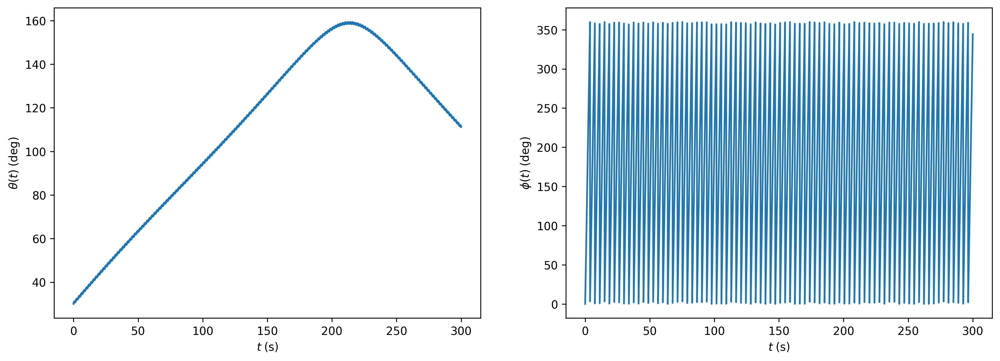

159.4113451065973
29.999999999999996


In [10]:
CI = [np.pi / 6, 0, 0, 0, 0, 2*np.pi*200]

t = np.linspace(0, 300, 10000)

g_ = 9.81
r = 53 / 2 * 1e-3
e = 12 * 1e-3
m_ = 0.375
#J3_ = m_ * (r**2) / 2
#J1_ = J3_ + m_ * e**2 / 12
J3_ = 0.000055
J1_ = 0.000055
h_ = 31.25 * 1e-3

x0_ = 5 * 1e-2
omega_f =  0.265
params_f = [g_, m_, h_, J1_, J3_, x0_, np.pi,  omega_f]



the_f, phi_f, _, _, _, _, _, _, _, path_f = Solve_Gyro_Forced_X(t, CI, params_f)

print(np.max(the_f) * 180 / np.pi)
print(np.min(the_f) * 180 / np.pi)

path_f

Precession frequency = 0.526334821965926
Rotation frequency = 100.01633382373701
Gyros number (frequency) = 190.0241626616373
Gyros number (parameters) = 188.93568461330307
Gyros number gap = 0.5761103576394396 %
Larmor frequency =  0.5293670913911347  Hz


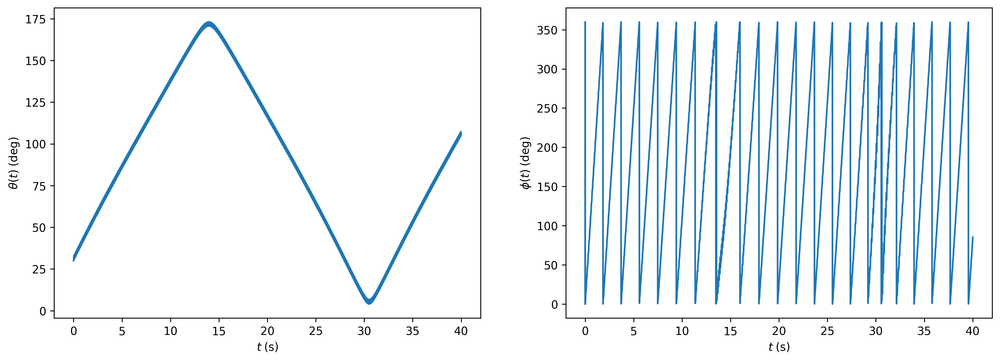

173.06164412222446
4.03058411314296


In [12]:
CI = [np.pi / 6, 0, 0, 0, 0, 2*np.pi*100]

t = np.linspace(0, 40, 10000)

g_ = 9.81
r = 53 / 2 * 1e-3
e = 12 * 1e-3
m_ = 0.375
#J3_ = m_ * (r**2) / 2
#J1_ = J3_ + m_ * e**2 / 12
J3_ = 0.000055
J1_ = 0.000055
h_ = 31.25 * 1e-3

x0_ = 5 * 1e-2
omega_f =  0.53
params_f = [g_, m_, h_, J1_, J3_, x0_, np.pi,  omega_f]



the_f, phi_f, _, _, _, _, _, _, _, path_f = Solve_Gyro_Forced_XY(t, CI, params_f)

print(np.max(the_f) * 180 / np.pi)
print(np.min(the_f) * 180 / np.pi)

path_f

In [47]:
%matplotlib inline

In [83]:
%matplotlib qt

In [43]:
params_f = [g_, m_, h_, J1_, J3_, x0_, 3 *  np.pi / 2, omega_f]


T, X, Y, Z, theta, phi, psi = Get_Gyro_Position(80, 10, CI, params_f)


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set(xlim3d=(-1.2, 1.2), xlabel='X')
ax.set(ylim3d=(-1.2, 1.2), ylabel='Y')
ax.set(zlim3d=(-1.2, 1.2), zlabel='Z')
# Tracé initial du point et de la ligne
point, = ax.plot([X[0]], [Y[0]], [Z[0]], 'b.')
line, = ax.plot(X[:1], Y[:1], Z[:1], color='b')

point_static, = ax.plot(0, 0, 0, 'k.')

# Ajouter une flèche
#arrow = FancyArrowPatch((0, 0, 0), (X[0], Y[0], Z[0]), mutation_scale=15, color='blue')
#ax.add_patch(arrow)



#x_gamma_Fe = np.sin(phi + params_f[-2]) * np.sin(theta ) + X
#y_gamma_Fe = -np.cos(phi + params_f[-2]) * np.sin(theta) + Y
#z_gamma_Fe = -np.sin(theta) * np.cos(params_f[-2]) + Z

#    Ideal case
x_gamma_Fe = np.sin(params_f[-1] * T + params_f[-2]) * np.sin(theta ) + X
y_gamma_Fe = -np.cos(params_f[-1] * T + params_f[-2]) * np.sin(theta) + Y
z_gamma_Fe = -np.sin(theta) * np.cos(params_f[-2] + params_f[-1] * T - phi) + Z

x_gamma_P = np.cos(phi) * np.sin(theta) + X * 0.5
y_gamma_P = np.sin(phi) * np.sin(theta) + Y * 0.5
z_gamma_P = Z * 0.5



# Initialiser la flèche
arrow = ax.quiver(0, 0, 0, 0, 0, 0, color='blue', arrow_length_ratio=0.01)

torque_Fe = ax.quiver(0, 0, 0, 0, 0, 0, color='red', arrow_length_ratio=0.01)

torque_P = ax.quiver(0, 0, 0, 0, 0, 0, color='green', arrow_length_ratio=100)


text_time = ax.text2D(0.02, 0.95, '', transform=ax.transAxes, color='black')

text_CI = ax.text2D(0.02, 1, r'$\theta_0 =$' + str(round(CI[0] * 180 / np.pi, 0)) + r'$^\circ$', transform=ax.transAxes, color='black')
text_CI_omega = ax.text2D(0.02, 0.9, r'$f_{\psi} =$' + str(round(CI[-1] / (2 * np.pi), 0)) + '$\;\mathrm{Hz}$', transform=ax.transAxes, color='black')


# Fonction de mise à jour pour l'animation
def update(num, X, Y, Z, point, line, point_static, arrow):
    point.set_data(X[num-1:num], Y[num-1:num])
    point.set_3d_properties(Z[num-1:num])

    line.set_data(X[:num], Y[:num])
    line.set_3d_properties(Z[:num])

    # Mettre à jour la position de la flèche
    arrow.set_segments([[[0, 0, 0], [X[num], Y[num], Z[num]]]])

    torque_Fe.set_segments([[[X[num], Y[num], Z[num]], [x_gamma_Fe[num], y_gamma_Fe[num], z_gamma_Fe[num]]]])
    torque_P.set_segments([[[0.5 * X[num], 0.5 * Y[num], 0.5 * Z[num]], [x_gamma_P[num], y_gamma_P[num], z_gamma_P[num]]]])

    text_time.set_text(f'Time: {T[num]:.2f} s')


    return point, line, point_static, arrow

# Augmenter la fréquence de trame pour accélérer l'animation
frame_rate = 10
num_frames = len(T)
interval = 50 #1000 / frame_rate

# Animer le tracé
ani = FuncAnimation(fig, update, frames=num_frames, interval=interval,
                    fargs=(X, Y, Z, point, line, point_static, arrow), blit=False)

# Enregistrer l'animation en tant que fichier vidéo avec Pillow
#ani.save('animation_3d_with_arrow.gif', writer=PillowWriter(fps=frame_rate))

#ani.save('animation_XY_RotatingRef.mp4', writer=FFMpegWriter(fps=frame_rate))



# Afficher le graphique interactif
plt.show()

Precession frequency = 0.5262532990729869
Rotation frequency = 100.04364252749181
Gyros number (frequency) = 190.10549236218014
Gyros number (parameters) = 189.03887361925567
Gyros number gap = 0.5642324895951079 %
Larmor frequency =  0.5292225911639228  Hz
Precession frequency = 0.5275349082300774
Rotation frequency = 100.04656535064012
Gyros number (frequency) = 189.64918489717485
Gyros number (parameters) = 189.04991950389083
Gyros number gap = 0.31698791242896074 %
Larmor frequency =  0.52920713012301  Hz


In [45]:
plt.figure()
plt.subplot(1,3,1)
plt.ylabel(r'$\vec{\mathcal{M}}(\vec{F_e}) \cdot \vec{u}_\rho$')
plt.plot(T, x_gamma_Fe * np.sin(phi))
plt.subplot(1,3,2)
plt.plot(T, y_gamma_Fe * (-np.cos(phi)) )
plt.ylabel(r'$\vec{\mathcal{M}}(\vec{F_e}) \cdot \vec{u}_\phi$')

plt.subplot(1,3,3)
plt.plot(T, z_gamma_Fe)
plt.ylabel(r'$\vec{\mathcal{M}}(\vec{F_e}) \cdot \vec{u}_z$')

plt.show()

In [40]:
if True:
    i = 0
    f = 1000000

    layout = go.Layout(
        title=r"Plot Title",
        scene=dict(
            xaxis_title=r"x",
            yaxis_title=r"y",
            zaxis_title=r"z",
            aspectratio=dict(x=1, y=1, z=1),
            camera_eye=dict(x=1.2, y=1.2, z=1.2),
        ),
    )

    fig = go.Figure(layout=layout)
    fig.add_scatter3d(x=[0], y=[0], z=[0])
    fig.add_scatter3d(
        x=x[i:f], y=y[i:f], z=z[i:f], mode="lines", line=dict(color="green", width=2)
    )

    fig.update_layout(
        scene=dict(
            xaxis=dict(
                range=[-1, 1],
            ),
            yaxis=dict(
                range=[-1, 1],
            ),
            zaxis=dict(
                range=[-1, 1],
            ),
        )
    )

    path = HTML(fig.to_html(default_width=1000, default_height=600))

path


In [ ]:
import numpy as np
import plotly.graph_objects as go

x,y,z = X, Y, Z


# Create figure
fig = go.Figure(
    data=[go.Scatter3d(x=[], y=[], z=[],
                     mode="markers",marker=dict(color="red", size=10))])
    
fig.update_layout(
        
         scene = dict(
        
        xaxis=dict(range=[min(x), max(x)], autorange=False),
        yaxis=dict(range=[min(y), max(y)], autorange=False),
        zaxis=dict(range=[min(z), max(z)], autorange=False),
        )),


frames = [go.Frame(data= [go.Scatter3d(
                                       x=x[[k]], 
                                       y=y[[k]],
                                       z=z[[k]])],
                   
                   traces= [0],
                   name=f'frame{k}'      
                  )for k  in  range(len(x))]
fig.update(frames=frames),




fig.update_layout(updatemenus=[dict(type="buttons",
                          buttons=[dict(label="Play",
                                        method="animate",
                                        args=[None, dict(frame=dict(redraw=True,fromcurrent=True, mode='immediate'))      ])])])


fig.show()


In [7]:
import numpy as np
import matplotlib
# matplotlib.use("Agg") # useful for a webserver case where you don't want to ever visualize the result live.
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.animation import FFMpegWriter, PillowWriter

# Change to reflect your file location!
plt.rcParams['animation.ffmpeg_path'] = '/opt/homebrew/bin/ffmpeg'


# Fixing random state for reproducibility
np.random.seed(19680801)


metadata = dict(title='Movie', artist='codinglikemad')
# writer = PillowWriter(fps=15, metadata=metadata)
writer = FFMpegWriter(fps=15, metadata=metadata)

fig, ax = plt.subplots(subplot_kw=dict(projection='3d'))

plt.xlim(-5, 5)
plt.ylim(-5, 5)


def func(x,y,r,t):
    return np.cos(r/2+t)*np.exp(-np.square(r)/50)

xvec = np.linspace(-10, 10, 1000)
yvec = np.linspace(-10, 10, 1000)

xlist, ylist = np.meshgrid(xvec, yvec)

rlist = np.sqrt( np.square(xlist) + np.square(ylist) )

with writer.saving(fig, "exp3d.mp4", 100):
    for tval in np.linspace(0,20,160):
        #print(tval)
        zval = func(xlist,ylist,rlist, tval)
        ax.set_zlim(-1, 1)
        ax.plot_surface(xlist,ylist,zval,cmap=cm.viridis)

        writer.grab_frame()
        plt.cla()


In [8]:
%matplotlib inline